<a id='1'></a>
# Applying Data/Network Science to study bibliographic data on
# "Social Justice & Computing" (1913-2020) 
# collected from the Web of Science 

<span style="color:green">
    
### [1. Keywords in the dataset ](#2)

### [2. Topic Modeling keywords through LDA (Latent Dirichlet Allocation)](#3)

### [3. Keywords counts](#4)

### [4. Keywords tf-idf scores over time](#5)

### [5. Keywords in LDA topics](#6)

### [6. The temporal hypergraph of keywords (vertices) and publications (hyperedges)](#7)

### [7. Persistent and intermittent keywords](#8)

### [8. EDA of keywords](#9)

</span>

<a id='2'></a>
## <span style="color:green">1. Keywords in the dataset</span>

In [112]:
print(len(list(odf.columns)))
print(list(odf.columns))
odf=odf[['Publication Year', 'Publication Type', 'Authors', 'Article Title', 'Author Keywords', 'Keywords Plus', 'Abstract']]
odf

68
['Publication Year', 'Publication Type', 'Authors', 'Article Title', 'Author Keywords', 'Keywords Plus', 'Abstract', 'Book Authors', 'Book Editors', 'Book Group Authors', 'Author Full Names', 'Book Author Full Names', 'Group Authors', 'Source Title', 'Book Series Title', 'Book Series Subtitle', 'Language', 'Document Type', 'Conference Title', 'Conference Date', 'Conference Location', 'Conference Sponsor', 'Conference Host', 'Addresses', 'Reprint Addresses', 'Email Addresses', 'Researcher Ids', 'ORCIDs', 'Funding Orgs', 'Funding Text', 'Cited References', 'Cited Reference Count', 'Times Cited, WoS Core', 'Times Cited, All Databases', '180 Day Usage Count', 'Since 2013 Usage Count', 'Publisher', 'Publisher City', 'Publisher Address', 'ISSN', 'eISSN', 'ISBN', 'Journal Abbreviation', 'Journal ISO Abbreviation', 'Publication Date', 'Volume', 'Issue', 'Part Number', 'Supplement', 'Special Issue', 'Meeting Abstract', 'Start Page', 'End Page', 'Article Number', 'DOI', 'Book DOI', 'Early Acc

,Publication Year,Publication Type,Authors,Article Title,Author Keywords,Keywords Plus,Abstract
295,1913,J,"Lyon, FE",PRISON LABOR AND SOCIAL JUSTICE,NaN,NaN,NaN
294,1960,J,"NEWTON, CA",FATHER COUGHLIN AND HIS NATIONAL UNION FOR SOC...,NaN,NaN,NaN
293,1975,J,"BOUDON, R",SOCIAL JUSTICE AND GENERAL INTEREST - CONCERNI...,NaN,NaN,NaN
7,2020,J,"Staller, KM",Stitching Tattered Cloth: Reflections on Socia...,Norman K; Denzin; Charles Loring Brace; Childr...,NaN,This article is a transcript of a keynote perf...
9,2020,J,"Jones, R",Social justice in library science programs: A ...,Content analysis; education; libraries; LIS ed...,INFORMATION-SCIENCE; CURRICULUM; DIVERSITY; VA...,"In an increasingly globalized world, social ju..."
10,2020,J,"Sheehy, C; Nayak, S",Black feminist methods of activism are the too...,alienation; Black feminism; global; interregnu...,NaN,We use the method of conversation as a tool of...
11,2020,J,"Levy, M; Lanamaki, A; Hirschheim, R",Robust A ction Strategies in a Connected but U...,Robust Action; Pragmatism; Social Justice; Gra...,GRAND CHALLENGES; SCIENCE; FOOD; PRINCIPLES; I...,"In this paper, we elucidate robust action as a..."
12,2020,B,"Bales, S; BudziseWeaver, T",Transformative Library and Information Work: P...,NaN,NaN,NaN


In [113]:
dfsh.style.set_properties(subset=['Keywords'], **{'width-min': '1000px'})

,Year,Publication,Keywords
295,1913,Lyon (1913),"['prison', 'labor', 'social_justice']"
294,1960,Newton (1960),"['union', 'social_justice']"
293,1975,Boudon (1975),"['social_justice', 'interest', 'theory', 'justice']"
292,1976,Klein (1976),"['wisp', 'social_justice']"
291,1976,Withers (1976),"['social_justice', 'disruption']"
290,1978,Reddy (1978),"['social_justice', 'study', 'land']"
289,1983,Anonymous (1983),['justice']
288,1984,Charnes (1984),"['justice', 'children', 'bulletin']"
287,1984,Edney (1984),"['rationality', 'social_justice']"
286,1985,Warshawsky (1985),"['justice', 'welfare', 'state']"


<a id='3'></a>
## <span style="color:green">2. Topic Modeling keywords through LDA (Latent Dirichlet Allocation)</span>

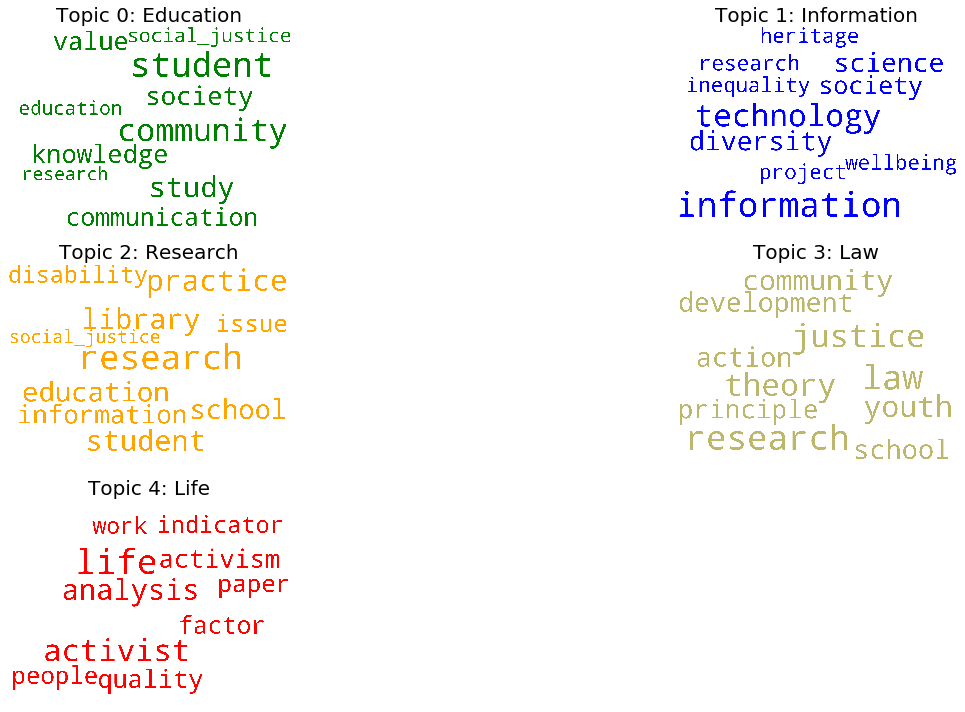

In [114]:
figsize=(1.4*fig_height  * plot_aspect_ratio, (10/5)*fig_height)
fig, axes = plt.subplots(dimy,dimx, figsize=figsize, sharex=True, sharey=True) # (14,17)
tti=['Topic ' + str(i) for i in range(best_num_lda_topics)]

ss=["Topic 0: Education","Topic 1: Information","Topic 2: Research","Topic 3: Law","Topic 4: Life"]
ssi=["Topic 0 (Education)","Topic 1 (Information)","Topic 2 (Research)","Topic 3 (Law)","Topic 4 (Life)"]

for i, ax in enumerate(axes.flatten()):
    if i<len(topics):
        fig.add_subplot(ax)
        topic_words = dict(topics[i][1])
        cloud.generate_from_frequencies(topic_words, max_font_size=300)
        ax.imshow(cloud)
#         ss=ss[i] #'Topic ' + str(i)
        ax.set_title(ss[i], fontdict=dict(size=20)) #
        ax.axis('off')

fig.delaxes(axes[2][1])

plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()

In [115]:
lda_df

,Topic 1: Education,Topic 2: Information,Topic 3: Research,Topic 4: Law,Topic 5: Life
0,school 0.023213148,library 0.023057926,student 0.019526893,education 0.017184265,research 0.027020235
1,student 0.014820409,information 0.020872526,community 0.017756071,article 0.013670916,community 0.014203614
2,problem 0.014620802,research 0.011847433,research 0.014179589,theory 0.013639808,activist 0.012532993
3,community 0.011366559,justice 0.011609352,youth 0.012087592,teacher 0.012893086,knowledge 0.011470349
4,study 0.010774835,society 0.011376879,article 0.010856692,justice 0.012883132,evaluation 0.01090325
5,paper 0.010387113,social_justice 0.011100327,life 0.009604517,people 0.011522022,social_justice 0.009544713
6,article 0.009389558,diversity 0.009954836,development 0.009312794,law 0.010700973,activism 0.008656511
7,work 0.009139895,issue 0.009917687,paper 0.009292173,disability 0.0092162,inquiry 0.008535961
8,approach 0.0084923245,value 0.009721754,technology 0.008749444,resilience 0.009074353,article 0.008335238
9,issue 0.007660764,access 0.009625159,practice 0.008584846,policy 0.008149005,scholar 0.008234534


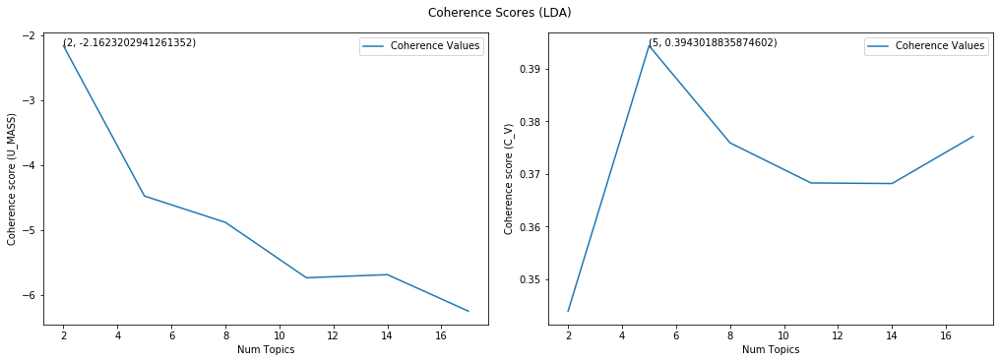

The most coherent number of LDA topics using the U_MASS measure is: 2
The most coherent number of LDA topics using the C_V measure is: 5


The most coherent number of LDA topics to use is: 5


In [116]:
from matplotlib.gridspec import GridSpec
best_num_lda_topics = show_best_num_topics('LDA', coh_list_lda_umass, coh_list_lda_cv, max_topics=20, min_topics=2, stride=3)
print('The most coherent number of LDA topics to use is: {}'.format(best_num_lda_topics))

<a id='4'></a>
## <span style="color:green">3. Keywords counts</span>

In [117]:
g1

:Overlay
   .Bars.I   :Bars   [index]   (unique)
   .Labels.I :Labels   [index,unique]   (unique)

In [118]:
g2

:Bars   [Year,Variable]   (value)

In [119]:
g3

:Bars   [Keyword]   (Frequency)

In [120]:
g4

:Histogram   [x]   (Frequency)

<a id='5'></a>
## <span style="color:green">4. Keywords tf-idf scores over time</span>

In [121]:
g7

:Bars   [Year,Publication]   (TF-IDF,Keyword)

In [122]:
g8

:Bars   [Year,Publication]   (TF-IDF,Keyword)

In [123]:
g9

:Bars   [Year,Publication]   (TF-IDF,Keyword)

In [124]:
g10

:Bars   [Year,Publication]   (TF-IDF,Keyword)

In [125]:
g11

:Bars   [Year,Publication]   (TF-IDF,Keyword)

In [126]:
g12

:Bars   [Year,Publication]   (TF-IDF,Keyword)

In [127]:
g13

:Bars   [Year,Publication]   (TF-IDF,Keyword)

<a id='6'></a>
## <span style="color:green">5. Keywords in LDA topics</span>

In [128]:
g14

:Bars   [Year,Publication]   (Topic 1 probability,Keyword)

In [129]:
g15

:Bars   [Year,Publication]   (Topic 2 probability,Keyword)

In [130]:
g16

:Bars   [Year,Publication]   (Topic 3 probability,Keyword)

In [131]:
g17

:Bars   [Year,Publication]   (Topic 4 probability,Keyword)

In [132]:
g18

:Bars   [Year,Publication]   (Topic 5 probability,Keyword)

<a id='7'></a>
## <span style="color:green">6. The temporal hypergraph of keywords (vertices) and publications (hyperedges)</span>

In [133]:
bundled

:Graph   [start,end]

In [134]:
tbundled

:Graph   [start,end]   (common_ldawords,weight)

<a id='8'></a>
## <span style="color:green">7. Persistent and intermittent keywords</span>

In [135]:
hm1

:HeatMap   [columns,index]   (value)

In [136]:
hm2

:HeatMap   [columns,index]   (value)

In [137]:
hm3

:HeatMap   [columns,index]   (value)

In [138]:
contdbars

:Bars   [Max Persistency]   (y)

In [139]:
discontdbars

:Bars   [Max Intermittency]   (y)

<a id='9'></a>
## <span style="color:green">8. EDA of keywords</span>

In [140]:
g4af

:Layout
   .BoxWhisker.I   :BoxWhisker   (Frequency)
   .BoxWhisker.II  :BoxWhisker   (Max Persistency)
   .BoxWhisker.III :BoxWhisker   (Max Intermittency)
   .BoxWhisker.IV  :BoxWhisker   (TF-IDF)
   .BoxWhisker.V   :BoxWhisker   [Variable]   (value)

In [141]:
g6f

:GridMatrix   [X,Y]
   :NdOverlay   [Dominant Topic of Publication]
      :Histogram   [Topic 5 probability]   (Topic 5 probability_frequency)

[Back](#1)